# Processing modules
This Notebook processes detected communities by *Infomap* (called *modules* internally) that are stored in `.clu` formatting.

In [1]:
import pickle
import sys
from pathlib import Path

import numpy as np
import pandas as pd
from IPython.core.display import display

sys.path.insert(1, str(Path.cwd() / 'utils'))
from hexbin import Hexbin  # noqa: E402
from module import Module  # noqa: E402
from particletype import Restricted, Unrestricted  # noqa: E402
from plot import plot_modules, plot_quality  # noqa: E402
from season import Season  # noqa: E402

## Reading modules
*Infomap* outputs a `.clu` file listing every node and the module to which they belong. The seed that yields the "best" partition is indicated by how well it minimizes the map equation (the seed that produces the minimum codelength) and is used hereafter.

In [2]:
particle_type = Restricted
season = Season.fall
markov_time = 2

path = Path.cwd() / 'network' / particle_type.name / season.name / str(markov_time)
seeds = list(sorted((path / 'clus').rglob('seed_*.txt')))
seed = 1

with open(Path.cwd() / 'network' / 'label_map.pickle', 'rb') as file:
    label_map = pickle.load(file)

modules, hexbins = Module.read_clu(seeds[seed], label_map, display_clu=True)

,node,module,flow
0,143,1,0.043397
1,178,1,0.041891
2,166,1,0.039620
3,190,1,0.032896
4,152,1,0.031612
...,...,...,...
956,2556,14,0.000000
957,2570,14,0.000000
958,2625,14,0.000000
959,3952,15,0.000225


In [3]:
# Create a hash map to assign an h3 index to an existing Hexbin object
hexbin_dict = dict((hexbin.h3, hexbin) for hexbin in hexbins)

# Represent particle trajectories as a tuple of reference Hexbins
with open(Path.cwd() / 'network' / particle_type.name / season.name / 'edges.pickle', 'rb') as file:
    edges = pickle.load(file)
trajectories = [(hexbin_dict[source_node], hexbin_dict[target_node]) for source_node, target_node in edges 
                if source_node in hexbin_dict.keys() and target_node in hexbin_dict.keys()]
del edges

In [4]:
# Get all hexbins in the domain that aren't used
domain_hexbins = [Hexbin(domain_node) for domain_node in label_map.keys() 
                  if all([domain_node != hexbin for hexbin in hexbins])]

Modules are smoothed if they have an insufficient number of constituent hexbins to be deemed meaningful. All irrelevant modules are plotted as grey to indicate that particles still spawned and settled in each hexbin.

In [5]:
module_colors = [
    '#a6cee3', '#1f77b4',
    '#ffbb78', '#ff7f0e',
    '#98df8a', '#2ca02c',
    '#eb7171', '#d62728',
    '#c5b0d5', '#9467bd',
    '#c49c94', '#8c564b',
    '#f7b6d2', '#e377c2',
    '#85ffdc', '#60d6b5',
    '#dbdb8d', '#bcbd22',
    '#e7ba53', '#bc9f39', 
    '#8ca152', '#637939',
    '#d6616a', '#833c38',
]
null_module_color = '#c7c7c7'

# Associate belonging hexbins to modules
for module in modules:
    module.associate_hexbins(hexbins)

# Smooth modules
null_module = Module(0)
null_module.color = null_module_color
modules = Module.smooth_modules(modules, null_module, hexbin_dict, module_colors)
calculation_modules = [module for module in modules if module.index != 0]

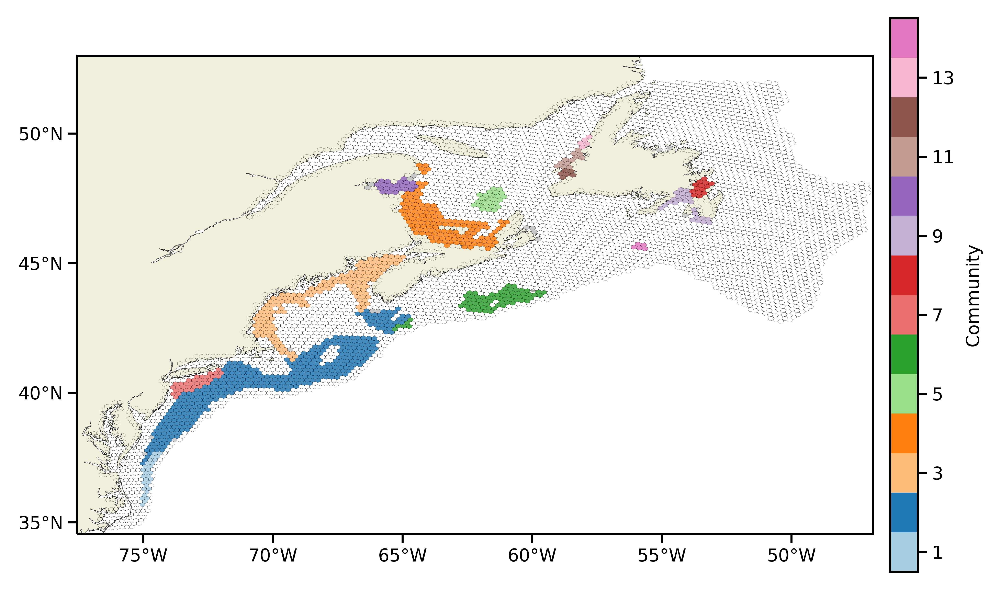

In [6]:
export_path = Path.cwd() / 'network' / particle_type.name / season.name / str(markov_time) / 'figs'
plot_modules(
    modules,
    other_hexagons=domain_hexbins, 
    colorbar=True, 
    colorbar_label='Community', 
    path=export_path / f'{seed}_modules',
)

In [7]:
# with open(Path.cwd() / 'data' / 'zones' / 'zones.pickle', 'rb') as file:
#     zones = pickle.load(file)
# plot_modules(
#     modules, 
#     zones=zones, 
#     other_hexagons=domain_hexbins, 
#     path=export_path / f'{seed}_modulesb'
# )
# del zones

## Quality parameters

The quality of the network partition can be evaluated by three parameters that assess particle modular movement:

1. *Coherence ratio* (Ser-Giacomi et al., 2015), 
2. *Fortress ratio*,
3. *Mixing parameter* (Ser-Giacomi et al., 2015).

The quality of each module is evaluated individually.


### Coherence ratio

The coherence ratio defined by Ser-Giacomi et al. (2015) of a module is the fraction of spawned particles in that module that also settled in that module.


0.9302570850430447


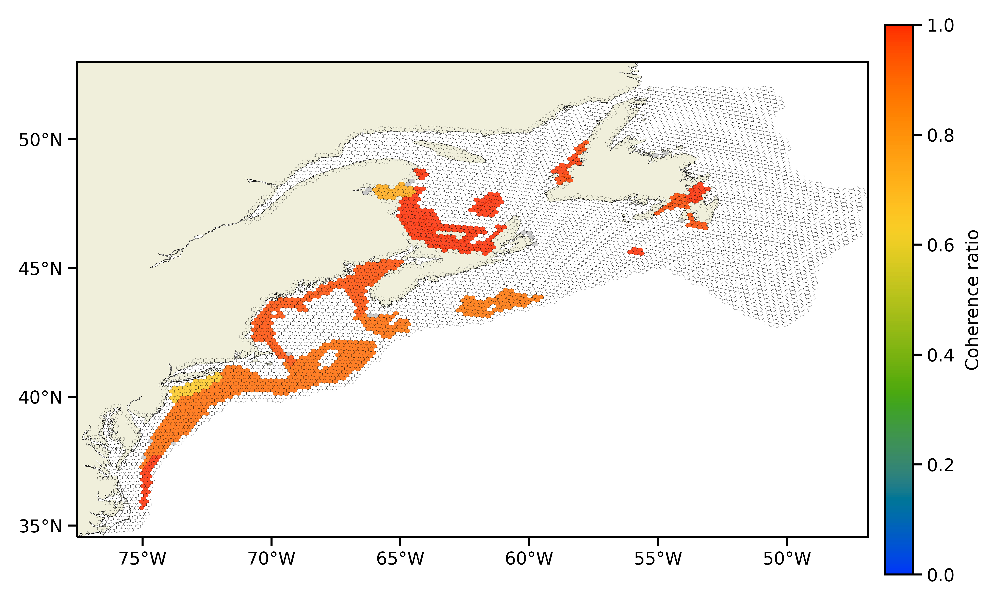

In [8]:
for module in calculation_modules:
    module.calculate_coherence(trajectories)

global_coherence = sum(module.coherence * len(module.hexbins) for module in calculation_modules) / (len(hexbins) - len(null_module.hexbins))
print(global_coherence)

plot_quality(
    modules,
    parameter='coherence',
    other_hexagons=domain_hexbins,
    colorbar_label='Coherence ratio',
    path=export_path / f'{seed}_cr'
)

### Fortress ratio

The fortress ratio of a community is the fraction of settled particles in that community that also spawned in that community.


0.9477388006213604


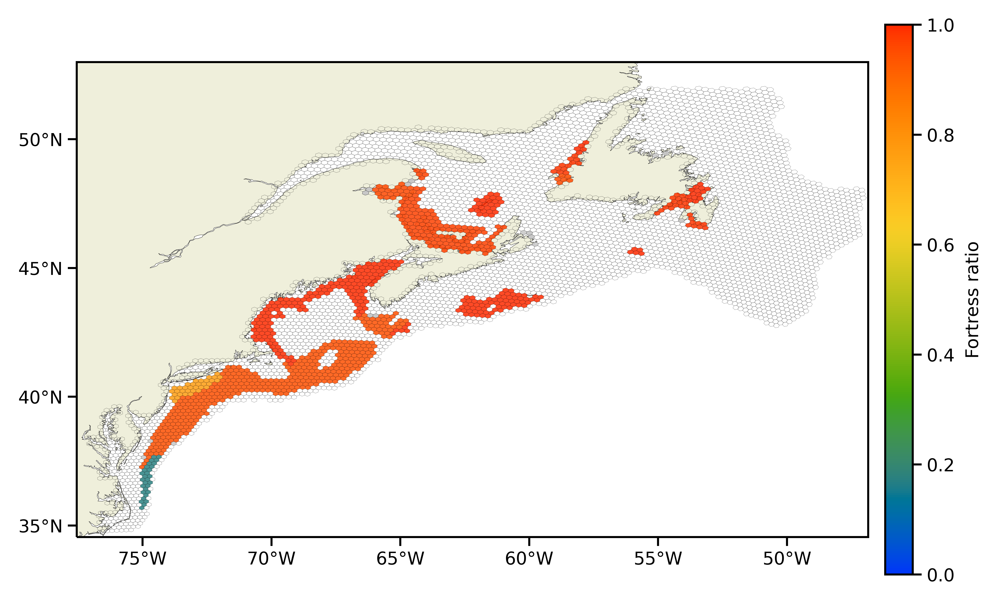

In [9]:
for module in calculation_modules:
    module.calculate_fortress(trajectories)

global_fortress = sum(module.fortress * len(module.hexbins) for module in calculation_modules) / (len(hexbins) - len(null_module.hexbins))
print(global_fortress)

plot_quality(
    modules,
    parameter='fortress',
    other_hexagons=domain_hexbins,
    colorbar_label='Fortress ratio',
    path=export_path / f'{seed}_fr'
)

### Mixing parameter

The mixing parameter defined by Ser-Giacomi et al. (2015) is an information-theoretic metric of intracommunity particle transfer. 


0.45984933397829825


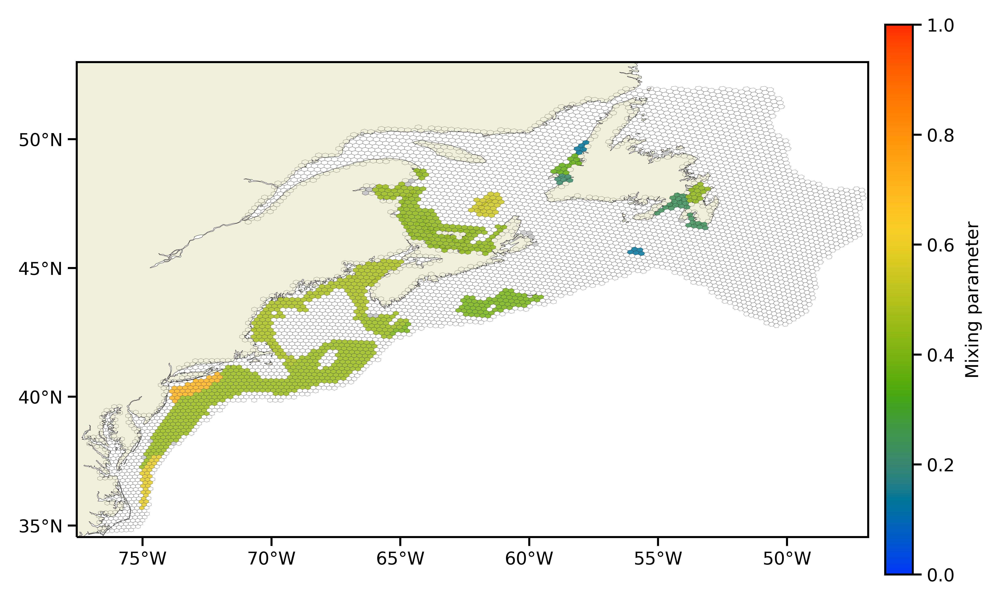

In [10]:
with open(Path.cwd() / 'network' / particle_type.name / season.name / 'transition_matrix.pickle', 'rb') as file:
    transition_matrix = pickle.load(file)
for module in calculation_modules:
    module.calculate_mixing(transition_matrix, hexbins)
del transition_matrix

global_mixing = sum(module.mixing * len(module.hexbins) for module in calculation_modules) / (len(hexbins) - len(null_module.hexbins))
print(global_mixing)

plot_quality(
    modules,
    parameter='mixing',
    other_hexagons=domain_hexbins,
    colorbar_label='Mixing parameter',
    path=export_path / f'{seed}_mp',
)

### Connectivity matrix

A connectivity matrix shows percent transfer between modules.

In [11]:
# Initialize counting matrix and vector
number_of_modules = len(modules)
transfer_matrix = np.zeros((number_of_modules, number_of_modules))
spawned_vector = np.zeros(number_of_modules)

# Count transfers from trajectories
for source, target in trajectories:
    source_index = source.module.index
    target_index = target.module.index
    spawned_vector[source_index] += 1
    transfer_matrix[source_index,target_index] += 1
connectivity_matrix = transfer_matrix / spawned_vector[:, None]
    

In [12]:
# Save connectivity data
csv_path = Path.cwd() / 'network' / particle_type.name / season.name / str(markov_time) / f'{seed}.csv'

df = pd.DataFrame(transfer_matrix, dtype=int)

for i in df:
    for j in df:
        if df.iloc[i,j] != 0:
            df.iloc[i,j] = str(round(df.iloc[i,j], 0)) + f' ({round(connectivity_matrix[i,j]*100,1)}%)'

df.index = np.arange(0, number_of_modules)
df.columns = np.arange(0, number_of_modules)
df.to_csv(csv_path)
display(df)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,18 (14.1%),7 (5.5%),31 (24.2%),9 (7.0%),47 (36.7%),0,1 (0.8%),0,1 (0.8%),3 (2.3%),11 (8.6%),0,0,0,0
1,0,1235 (100.0%),0,0,0,0,0,0,0,0,0,0,0,0,0
2,62 (0.1%),5937 (7.8%),68549 (90.2%),24 (0.0%),0,0,0,1432 (1.9%),0,0,0,0,0,0,0
3,12 (0.1%),0,742 (4.5%),15787 (95.4%),0,0,0,0,0,0,0,0,0,0,0
4,3 (0.0%),0,0,0,11852 (99.7%),2 (0.0%),0,0,0,0,30 (0.3%),0,0,0,0
5,4 (0.2%),0,0,0,0,1640 (99.8%),0,0,0,0,0,0,0,0,0
6,0,0,422 (12.4%),0,0,0,2968 (87.6%),0,0,0,0,0,0,0,0
7,0,0,2547 (35.1%),0,0,0,0,4703 (64.9%),0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,314 (100.0%),0,0,0,0,0,0
9,10 (4.0%),0,0,0,0,0,0,0,0,242 (96.0%),0,0,0,0,0


## References

Ser-Giacomi, E., Rossi, V., López, C., & Hernández-García, E. (2015). Flow networks: A characterization of geophysical fluid transport. *Chaos: An Interdisciplinary Journal of Nonlinear Science*, *25*(3), 36404. https://doi.org/10.1063/1.4908231